In [21]:
import zipfile
import csv
import os
import pandas as pd 
import re
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import traceback

In [22]:
def process_session_log(file_path):
    """
    Processes a session log file and extracts relevant data into a pandas DataFrame.

    Args:
        file_path (str): The path to the session log file.

    Returns:
        pd.DataFrame: A DataFrame containing the extracted data with columns:
            - "Minutes": List of minutes played.
            - "Seconds": List of seconds played.
            - "Milliseconds": List of milliseconds played.
            - "Deaths": List of player deaths.
            - "Game Completed": List of boolean values indicating if the game was completed.

        None: If no valid data is found or an error occurs during processing.

    Raises:
        Exception: If an error occurs while reading or processing the file.
    """
    # Logic to process session log files
    data = {"Minutes": [], "Seconds": [], "Milliseconds": [], "Deaths": [], "Game Completed": []}

    try:
        with open(file_path, 'r') as file:
            for line in file:
                line = line.strip()  # Remove extra whitespace
                if line == "----":
                    break
                if not line:
                    continue
                if ":" in line:
                    key, value = map(str.strip, line.split(":", 1))
                    if key in "Total Time Played (minutes:seconds:milliseconds)":
                         time_parts = value.split(":")[-3:]  # Take only the last 3 parts
                         if len(time_parts) == 3:
                            minutes, seconds, milliseconds = map(int, time_parts)
                            data["Minutes"].append(minutes)
                            data["Seconds"].append(seconds)
                            data["Milliseconds"].append(milliseconds)
                         else:
                            print(f"Invalid time format: {value}. Skipping.")
                    elif key == "Player Died":
                        data["Deaths"].append(int(value))
                    elif key == "Game Completed":
                        data["Game Completed"].append(value.lower() == "true")
                else:
                    print(f"Skipping invalid line: {line}")

        if any(data.values()):
            return pd.DataFrame(data)
        else:
            print(f"No valid data found in {file_path}")
            return None

    except Exception as e:
        print(f"Error processing session log file {file_path}: {e}")
        return None

In [23]:
def process_participant_data(participant_folder_path):
    participant_data = {
        "fys_game": [],
        "fys_baseline": [],
        "session_log": []
    }

    for file in os.listdir(participant_folder_path):
        file_path = os.path.join(participant_folder_path, file)

        if file.endswith(".csv"):
            # Handle different file types
            if "_game" in file:
                continue
                #print(f"Loading it as fys game: {file_path}")
                # Placeholder for game-specific processing
                #game_data = process_game_file(file_path)
                #print(game_data)
                #participant_data["fys_game"].append(game_data)

            elif "baseline" in file:
                print(f"Loading it as fys baseline: {file_path}")
                # Placeholder for baseline-specific processing
                #baseline_data = process_baseline_file(file_path)
                #print("After processing:")
                #print(baseline_data)
                #participant_data["fys_baseline"].append(baseline_data)

            else:
                continue
                #print(f"Loading it as session log: {file_path}")
                #session_data = process_session_log(file_path)
                #print(session_data)
                #participant_data["session_log"].append(session_data)

    return participant_data

In [24]:

session_log_folder_path = "Sessionlog"
participant_data_all = {}

# Iterate through each participant folder
for participant_folder in os.listdir(session_log_folder_path):
    participant_folder_path = os.path.join(session_log_folder_path, participant_folder)
    if os.path.isdir(participant_folder_path):
        print(f"Processing participant: {participant_folder}")
        
        # Process the participant's data
        participant_data = process_participant_data(participant_folder_path)
        
        # Save the processed data in the main dictionary
        participant_data_all[participant_folder] = participant_data
    break


Processing participant: Testie1
Loading it as fys baseline: Sessionlog\Testie1\NewSessionLog_20241202_133557_baseline.csv


## COOL STUFF ##

In [25]:
def stringTonumb(input):
    getVals = [val for val in input if val.isdigit() or val == '.']
    result = "".join(getVals)
    try:
        return float(result)
    except ValueError:
        return -1


In [26]:
def process_phys_data(filepath):
    cleaned_data = {}
    with open(filepath, 'r') as infile:
        for index, line in enumerate(infile):
            striped = line.strip()
            colm = striped.split(";")
            if index == 0:
                headers = [header.strip() for header in colm]
                cleaned_data = {header: [] for header in headers}
            else:
                if len(colm) <= 3:
                    continue
                
                if (len(colm) > 5 and stringTonumb(colm[5]) != 1):
                    continue
                
                # Apply stringTonumb and filter out None values
                colm = [stringTonumb(val) for val in colm]
                colm = [val for val in colm if val is not None]  # Filter out None values

                for header, value in zip(headers, colm):
                    cleaned_data[header].append(value)
    return cleaned_data


In [27]:
def format_milliseconds(ms):
    minutes = ms // (60 * 1000)
    seconds = (ms % (60 * 1000)) // 1000
    milliseconds = ms % 1000
    return f"{minutes}:{seconds:02}:{milliseconds:03}"

def clean_phys_data(base_clean, game_clean, axis = "HR", axis_name = "Heart Rate"):
    """
    Cleans and processes physiological data from baseline and game sessions.

    Parameters:
    base_clean (pd.DataFrame): DataFrame containing baseline physiological data.
    game_clean (pd.DataFrame): DataFrame containing game session physiological data.
    axis (str): The column name in the DataFrame representing the physiological metric to be processed (default is "HR").
    axis_name (str): The name of the physiological metric to be used in the output DataFrame (default is "Heart Rate").

    Returns:
    tuple: A tuple containing:
        - game_data (pd.DataFrame): DataFrame with cleaned and formatted game session data, including timestamps and physiological metrics.
        - baseline_avg_hr (float): The average value of the physiological metric from the baseline data.
    """
    base_hr = base_clean[axis]
    print(f"length: {len(base_hr)} , sum: {sum(base_hr)}")
    try:
        baseline_avg_hr = sum(base_hr) / len(base_hr)
    except ZeroDivisionError:
        baseline_avg_hr = 0
        print("Something went wrong with the baseline")
    print(f"Average HR: {baseline_avg_hr}")

    game_timestamps = [] 
    game_hr = [] 
    last_hr = -1

    for i, hr in enumerate(game_clean[axis]):
        if i != 0:
            if game_clean[axis][i] == last_hr:
                continue
            game_hr.append(game_clean[axis][i-1])
            game_timestamps.append(game_clean["MCU timestamp"][i-1])
            game_hr.append(game_clean[axis][i])
            game_timestamps.append(game_clean["MCU timestamp"][i])
            last_hr = game_clean[axis][i]
        else:
            game_hr.append(game_clean[axis][i])
            game_timestamps.append(game_clean["MCU timestamp"][i])
            last_hr = game_clean[axis][i]

    # Format timestamps to min:sec:msec
    formatted_timestamps = [format_milliseconds(ts) for ts in game_timestamps]

    # Create DataFrame
    game_data = pd.DataFrame({
        "Timestamp": game_timestamps,
        "Formattede Timestap": formatted_timestamps,
        axis_name: game_hr,
    })

    print(f"Timestamp: {len(game_timestamps)}\nHeart Rate: {len(game_hr)}")
    return game_data, baseline_avg_hr



In [ ]:
def plot_phys(hr_data, gsr_data, baseline_avg_gsr ,baseline_avg_hr, path, size = (30,10)):
    hr_path =  path+"hr.png"
    gsr_path = path +"gsr.png"
    print(f"Going to save plots at:\n{hr_path}\n{gsr_path}")
    base_phys_plot(hr_data,baseline_avg_hr,hr_path,size)
    base_phys_plot(gsr_data,baseline_avg_gsr,gsr_path,size, y_axis="Galvanic Skin Response")


def base_phys_plot(game_data ,baseline_avg_hr, path, size = (30,10), x_axis = "Timestamp", y_axis = "Heart Rate"):
    print(game_data)
    plt.figure(figsize=size)
    sns.set_theme(style="darkgrid")
    sns.lineplot(x=x_axis, y=y_axis,
                data=game_data)
    plt.axhline(baseline_avg_hr,color = "Green")
    plt.savefig(path)
    plt.show()

In [29]:
def save_Clean_Phys_As_CSV(filepath, data_dict, hr_b_avg, gsr_b_avg):
    print("Try to save it to disk")
    print(data_dict)
    try:
        dataframe = pd.DataFrame(data_dict)
    except ValueError as e:
        raise ValueError(f"Failed to convert dictionary to DataFrame: {e}")
    
    # Ensure required columns exist
    required_columns = ["MCU timestamp", "HR", "GSR average"]
    if not all(col in dataframe.columns for col in required_columns):
        raise ValueError(f"Input dictionary must contain the keys: {', '.join(required_columns)}")
    
    # Format MCU timestamps using your `format_milliseconds` function
    dataframe["Formattede Timestap"] = dataframe["MCU timestamp"].apply(format_milliseconds)
    
    # Select and rename relevant columns for saving
    cleaned_data = dataframe[["Formattede Timestap", "MCU timestamp", "HR", "GSR average"]].copy()
    cleaned_data.rename(columns={
        "Formattede Timestap": "Formatted Timestamp",
        "MCU timestamp": "MCU Timestamp",
        "HR": "Heart Rate",
        "GSR average": "GSR Average"
    }, inplace=True)
    
    # Add baseline averages as metadata
    metadata = pd.DataFrame({
        "Baseline": ["Heart Rate", "GSR Average"],
        "Value": [hr_b_avg, gsr_b_avg]
    })
    with open(filepath, "w", newline="") as f:
        f.write("# Baseline Averages\n")
        metadata.to_csv(f, index=False, line_terminator="\n")
        f.write("\n# Cleaned Data\n")
        cleaned_data.to_csv(f, index=False, line_terminator="\n")
    
    print(f"Data with baselines saved to {filepath}")


In [43]:
from scipy.signal import butter, filtfilt

def apply_low_pass_filter(data, cutoff_frequency, sampling_rate, order=5):
    """
    Applies a low pass filter to the given data.

    Args:
        data (list or np.array): The data to be filtered.
        cutoff_frequency (float): The cutoff frequency of the filter.
        sampling_rate (float): The sampling rate of the data.
        order (int, optional): The order of the filter. Default is 5.

    Returns:
        np.array: The filtered data.
    """
    nyquist = 0.5 * sampling_rate
    #print(f"nyquist: {nyquist}")
    normal_cutoff = cutoff_frequency / nyquist
    #print(f"normal_cutoff: {normal_cutoff}")
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    filtered_data = filtfilt(b, a, data)
    return filtered_data


# Example usage:
# Assuming `hr_data` is a list or numpy array of heart rate values
# cutoff_frequency = 0.1  # Example cutoff frequency
# sampling_rate = 1.0  # Example sampling rate (1 Hz)
# filtered_hr_data = apply_low_pass_filter(hr_data, cutoff_frequency, sampling_rate)

**Print out plot for one Testie:**


length: 2736 , sum: 311275.0
Average HR: 113.77010233918129
Timestamp: 695
Heart Rate: 695


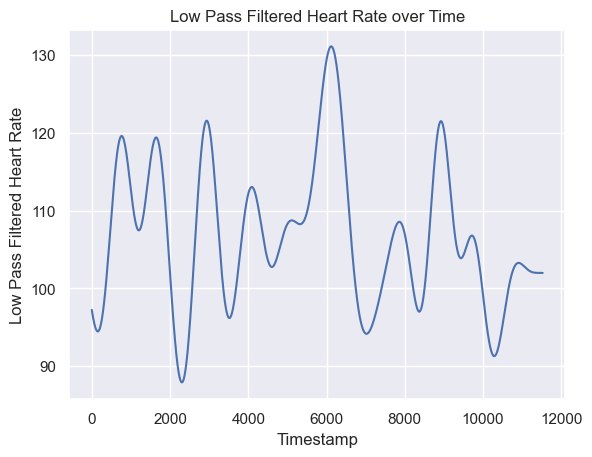

length: 2736 , sum: 3288.0
Average HR: 1.2017543859649122
Timestamp: 1155
Heart Rate: 1155


In [59]:

session_log_folder_path = "Sessionlog"
baseline_path = os.path.join(session_log_folder_path, "Testie1", "NewSessionLog_20241202_133557_baseline.csv")
game_path = os.path.join(session_log_folder_path, "Testie1", "NewSessionLog_20241202_133557_gameData.csv")
plot_path = os.path.join(session_log_folder_path, "Testie1", "plot")
out_path = os.path.join(session_log_folder_path, "Testie1", "out.csv")
base_clean = process_phys_data(baseline_path)
game_clean = process_phys_data(game_path)


hr_gd, hr_b_avg = clean_phys_data(base_clean,game_clean)
#print(f"hr is: {hr_gd['Heart Rate']}")
hr_lp = apply_low_pass_filter(game_clean["HR"], 0.1, 95)  
plt.plot( hr_lp)
plt.xlabel("Timestamp")
plt.ylabel("Low Pass Filtered Heart Rate")
plt.title("Low Pass Filtered Heart Rate over Time")
plt.show()  
gsr_gd, gsr_b_avg = clean_phys_data(base_clean ,game_clean, axis="GSR average",  axis_name="Galvanic Skin Response")
#plot_phys(hr_gd , gsr_gd,gsr_b_avg,hr_b_avg,plot_path)
#save_Clean_Phys_As_CSV(out_path,game_clean,hr_b_avg,gsr_b_avg)

**Do it for all Testies**

In [ ]:
all_participants_data = []
groups_df = pd.read_csv("Groups.csv")  # Assumes columns: ["Participant", "Group"]
# Iterate through participant folders
for participant_folder in os.listdir(session_log_folder_path):
    participant_folder_path = os.path.join(session_log_folder_path, participant_folder)
    if os.path.isdir(participant_folder_path):
        try:
            print(f"## Processing participant: {participant_folder} ##\n")
            
            # Identify paths for baseline and game data
            baseline_path = next(
                (os.path.join(participant_folder_path, f) for f in os.listdir(participant_folder_path) if "_baseline" in f),
                None
            )
            game_path = next(
                (os.path.join(participant_folder_path, f) for f in os.listdir(participant_folder_path) if "_gameData" in f),
                None
            )
            
            # Process data
            base_clean = process_phys_data(baseline_path)
            game_clean = process_phys_data(game_path)
            hr_gd, hr_b_avg = clean_phys_data(base_clean, game_clean)
            gsr_gd, gsr_b_avg = clean_phys_data(base_clean, game_clean, axis="GSR average", axis_name="Galvanic Skin Response")
            plot_phys(hr_gd, gsr_gd, gsr_b_avg, hr_b_avg, plot_path)
            save_Clean_Phys_As_CSV(out_path, game_clean, hr_b_avg, gsr_b_avg)
        except Exception as e:
            print(f"Error processing {participant_folder}: {e}")


## Processing participant: Testie1 ##

game_clean: {'Reference timestamp': [2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134749.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134750.0, 2122024134751.0, 2122024134751.0, 2122024134751.0, 2122024134751.0, 2122024134751.0, 212202

In [ ]:
# Initialize an empty list to collect participant data
all_participants_data = []
missing_data_participants = []
# Read group information from the CSV
groups_df = pd.read_csv("Groups.csv")  # Assumes columns: ["Participant", "Group"]

# Iterate through participant folders
for participant_folder in os.listdir(session_log_folder_path):
    participant_folder_path = os.path.join(session_log_folder_path, participant_folder)
    if os.path.isdir(participant_folder_path):
        try:
            print(f"## Processing participant: {participant_folder} ##\n")
            
            # Identify paths for baseline and game data
            baseline_path = next(
                (os.path.join(participant_folder_path, f) for f in os.listdir(participant_folder_path) if "_baseline" in f),
                None
            )
            game_path = next(
                (os.path.join(participant_folder_path, f) for f in os.listdir(participant_folder_path) if "_gameData" in f),
                None
            )
            
            # Process data
            base_clean = process_phys_data(baseline_path)
            game_clean = process_phys_data(game_path)

            if not game_clean["HR"] or not game_clean["MCU timestamp"]:
                print(f"Missing or incomplete data for participant: {participant_folder}")
                missing_data_participants.append(participant_folder)  # Add to missing list
                continue  # Skip this participant and move to the next
            
            # Check if keys exist in game_clean
            if "MCU timestamp" not in game_clean or "HR" not in game_clean:
                raise ValueError(f"Missing expected keys in game_clean for participant {participant_folder}")
            
            hr_gd, hr_b_avg = clean_phys_data(base_clean, game_clean)
            gsr_gd, gsr_b_avg = clean_phys_data(base_clean, game_clean, axis="GSR average", axis_name="Galvanic Skin Response")
            
            print()
            # Create a new dictionary for normalized data (to avoid overwriting game_clean)
            normalized_data = {
                "MCU timestamp": game_clean["MCU timestamp"],  # Retain original timestamps
                "HR": game_clean["HR"],  # Retain original HR values
            }
            
            # Normalize time and heart rate
            total_time = normalized_data["MCU timestamp"][-1] - normalized_data["MCU timestamp"][0]
            print("Total time "+str(total_time))
            normalized_data["Normalized Time"] = [(ts - normalized_data["MCU timestamp"][0]) / total_time for ts in normalized_data["MCU timestamp"]]
            normalized_data["Normalized HR"] = [(hr - hr_b_avg) / hr_b_avg * 100 for hr in normalized_data["HR"]]
            
            # Add participant and group information to the normalized data dictionary
            participant_group = groups_df.loc[groups_df["Partipants"] == participant_folder, "Group"].iloc[0]
            normalized_data["Partipants"] = [participant_folder] * len(normalized_data["MCU timestamp"])
            normalized_data["Group"] = [participant_group] * len(normalized_data["MCU timestamp"])
            
            # Collect processed and normalized data
            all_participants_data.append({
                "Normalized Time": normalized_data["Normalized Time"],
                "Normalized HR": normalized_data["Normalized HR"],
                "Partipants": normalized_data["Partipants"],
                "Group": normalized_data["Group"],
            })
            print(f"Data for {participant_folder} processed and added.")  # Debugging: Confirm data was added
            
        except Exception as e:
            print(f"Error processing {participant_folder}: {e}")
            print(f"Error processing {participant_folder}:")
            traceback.print_exc()
            break

# Debugging: Print the collected data
print(f"Total participants processed: {len(all_participants_data)}")
if len(all_participants_data) > 0:
    print(f"Sample data: {all_participants_data[0]}")  # Check a sample of the collected data


## Processing participant: Testie1 ##

length: 2736 , sum: 311275.0
Average HR: 113.77010233918129
Timestamp: 695
Heart Rate: 695
length: 2736 , sum: 3288.0
Average HR: 1.2017543859649122
Timestamp: 1155
Heart Rate: 1155

Total time 143316.0
Data for Testie1 processed and added.
## Processing participant: Testie10 ##

length: 2260 , sum: 271775.0
Average HR: 120.25442477876106
Timestamp: 449
Heart Rate: 449
length: 2260 , sum: 20626.0
Average HR: 9.126548672566372
Timestamp: 759
Heart Rate: 759

Total time 283263.0
Data for Testie10 processed and added.
## Processing participant: Testie11 ##

Missing or incomplete data for participant: Testie11
## Processing participant: Testie12 ##

Missing or incomplete data for participant: Testie12
## Processing participant: Testie13 ##

Missing or incomplete data for participant: Testie13
## Processing participant: Testie14 ##

length: 2843 , sum: 311700.0
Average HR: 109.63770664790714
Timestamp: 435
Heart Rate: 435
length: 2843 , sum: 25651.0
Av

6
13
All test partipant length:19


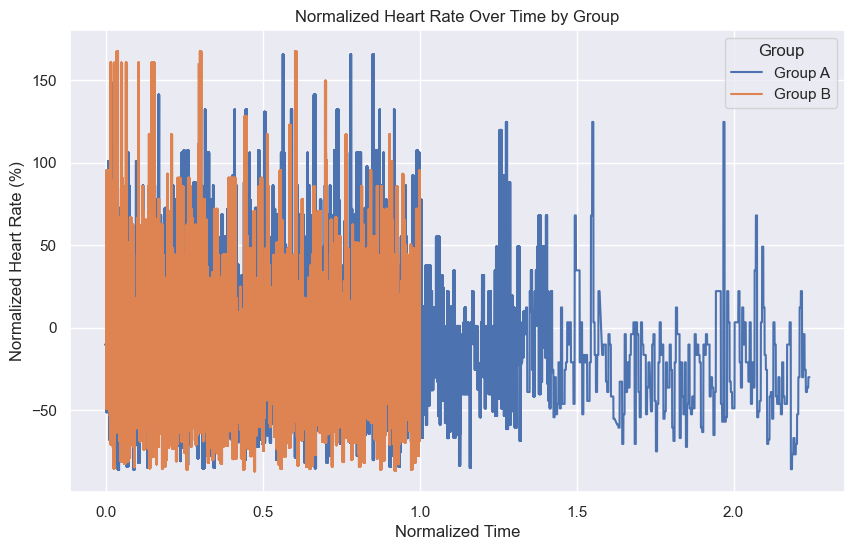

Participants with missing data:
['Testie11', 'Testie12', 'Testie13', 'Testie15', 'Testie16', 'Testie17']


In [ ]:
def group_phys_plot(combined_data, path, size=(10, 6)):
    plt.figure(figsize=size)
    sns.set_theme(style="darkgrid")
    sns.lineplot(x="Normalized Time", y="Normalized HR", hue="Group", data=combined_data)
    #plt.axhline(0, color="gray", linestyle="--", linewidth=0.8) 
    plt.title("Normalized Heart Rate Over Time by Group")
    plt.xlabel("Normalized Time")
    plt.ylabel("Normalized Heart Rate (%)")
    plt.legend(title="Group")
    plt.savefig(path)
    plt.show()


print(len(missing_data_participants))
print(len(all_participants_data))
print(f"All test partipant length:{len(all_participants_data) + len(missing_data_participants)}")
# Convert the list of dictionaries to a DataFrame
combined_data = pd.DataFrame()

# Append all participant data to the combined DataFrame
for data_dict in all_participants_data:
    df = pd.DataFrame(data_dict)  # Convert dictionary to DataFrame
    combined_data = pd.concat([combined_data, df], ignore_index=True)

# Now you have the combined_data DataFrame with normalized data
# Plot trends
plot_path = "group_plot.png"  # Specify the plot save path
group_phys_plot(combined_data, plot_path)

# Print the list of participants with missing data
print("Participants with missing data:")
print(missing_data_participants)